In [1]:
import numpy as np
import pandas as pd


In [3]:
from sklearn.model_selection import StratifiedKFold, train_test_split

In [4]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder

In [5]:
data =pd.read_csv('transformed.csv')
data.set_index('id',inplace=True)
data =data.iloc[:,1:]
X = data.drop(columns=['class'],axis=1)

In [6]:
y = data['class']
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [7]:
from xgboost import XGBClassifier
import pickle
from sklearn.base import clone
from sklearn.metrics import matthews_corrcoef

In [8]:
with open('xbg.pkl', 'rb') as f:
    model = pickle.load(f)

In [8]:
testcsv = pd.read_csv('test.csv',index_col='id')

In [9]:
testcsv

,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-spacing,gill-color,stem-height,stem-width,stem-root,stem-surface,stem-color,veil-type,veil-color,has-ring,ring-type,spore-print-color,habitat,season
id,,,,,,,,,,,,,,,,,,,,
3116945,8.64,x,NaN,n,t,NaN,NaN,w,11.13,17.12,b,NaN,w,u,w,t,g,NaN,d,a
3116946,6.90,o,t,o,f,NaN,c,y,1.27,10.75,NaN,NaN,n,NaN,NaN,f,f,NaN,d,a
3116947,2.00,b,g,n,f,NaN,c,n,6.18,3.14,NaN,NaN,n,NaN,NaN,f,f,NaN,d,s
3116948,3.47,x,t,n,f,s,c,n,4.98,8.51,NaN,NaN,w,NaN,n,t,z,NaN,d,u
3116949,6.17,x,h,y,f,p,NaN,y,6.73,13.70,NaN,NaN,y,NaN,y,t,NaN,NaN,d,u
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5194904,0.88,x,g,w,f,a,d,w,2.67,1.35,NaN,NaN,e,NaN,NaN,f,f,NaN,d,u
5194905,3.12,x,s,w,f,d,c,w,2.69,7.38,NaN,NaN,w,NaN,NaN,f,f,NaN,g,a
5194906,5.73,x,e,e,f,a,NaN,w,6.16,9.74,NaN,NaN,y,NaN,w,t,z,NaN,d,a


In [10]:
test_data = pd.read_csv('test_proc.csv')

In [11]:
test_data.index.name = 'id'

In [12]:
test_data

,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-spacing,gill-color,stem-height,stem-width,stem-root,stem-surface,stem-color,veil-type,veil-color,has-ring,ring-type,spore-print-color,habitat,season
id,,,,,,,,,,,,,,,,,,,,
0,8.64,60.0,47.0,44.0,19.0,54.0,28.0,53.0,11.13,17.12,9.0,42.0,52.0,13.0,22.0,18.0,15.0,21.0,16.0,0.0
1,6.90,51.0,54.0,46.0,5.0,54.0,17.0,55.0,1.27,10.75,21.0,42.0,38.0,10.0,15.0,6.0,14.0,21.0,16.0,0.0
2,2.00,36.0,38.0,44.0,5.0,54.0,17.0,41.0,6.18,3.14,21.0,42.0,38.0,10.0,15.0,6.0,14.0,21.0,16.0,1.0
3,3.47,60.0,54.0,44.0,5.0,58.0,17.0,41.0,4.98,8.51,21.0,42.0,52.0,10.0,14.0,18.0,36.0,21.0,16.0,2.0
4,6.17,60.0,39.0,56.0,5.0,56.0,28.0,55.0,6.73,13.70,21.0,42.0,54.0,10.0,23.0,18.0,23.0,21.0,16.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2077959,0.88,60.0,38.0,54.0,5.0,37.0,18.0,53.0,2.67,1.35,21.0,42.0,29.0,10.0,15.0,6.0,14.0,21.0,16.0,2.0
2077960,3.12,60.0,51.0,54.0,5.0,41.0,17.0,53.0,2.69,7.38,21.0,42.0,52.0,10.0,15.0,6.0,14.0,21.0,19.0,0.0
2077961,5.73,60.0,36.0,34.0,5.0,37.0,28.0,53.0,6.16,9.74,21.0,42.0,54.0,10.0,22.0,18.0,36.0,21.0,16.0,0.0


### Before stratified K-Fold lets do some analyses

In [41]:
pred_ = model.predict_proba(test_data)

In [45]:
pred_

array([[0.66576123, 0.33423877],
       [0.0488534 , 0.9511466 ],
       [0.04777145, 0.95222855],
       ...,
       [0.03380924, 0.96619076],
       [0.5626184 , 0.4373816 ],
       [0.24685377, 0.75314623]], dtype=float32)

<Axes: ylabel='Count'>

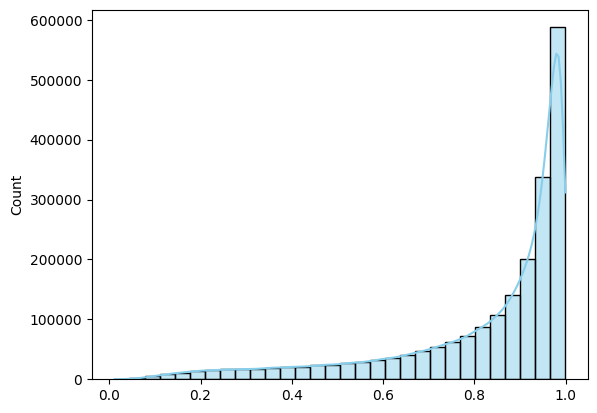

In [50]:
import seaborn as sns
sns.histplot(pred_[:,1], kde=True, bins=30, color='skyblue')

In [13]:
from xgboost import XGBClassifier
from sklearn.metrics import matthews_corrcoef
xgboost_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42,n_estimators=1000, 
                        max_depth=5,tree_method= 'gpu_hist')

In [53]:
X = pd.read_csv('X.csv')

In [55]:
X.index.name = 'id'

In [59]:
Y = pd.read_csv('Y.csv')

In [61]:
Y.index.name = 'id'

In [62]:
Y

,class
id,
0,0.0
1,1.0
2,0.0
3,0.0
4,0.0
...,...
3116940,0.0
3116941,0.0
3116942,1.0


In [14]:
#Define Stratified K-Fold
n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

def k_fold_model_trainer(model, X, y, skf, test_data):
    """
    Trains the model using Stratified K-Fold cross-validation and evaluates using MCC.
    Returns the average validation MCC and test predictions.
    """
    train_mcc_scores = []
    val_mcc_scores = []
    test_preds = np.zeros(len(test_data))
    
    fold_number = 1
    for train_index, val_index in skf.split(X, y):
        print(f'Fold {fold_number}')
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y[train_index], y[val_index]
        
        # Clone the model to ensure fresh parameters
        model_clone = clone(model)
        
        # Fit the model
        model_clone.fit(X_train, y_train)
        
        # Predict on training and validation sets
        y_train_pred = model_clone.predict(X_train)
        y_val_pred = model_clone.predict(X_val)
        
        # Calculate MCC scores
        train_mcc = matthews_corrcoef(y_train, y_train_pred)
        val_mcc = matthews_corrcoef(y_val, y_val_pred)
        
        print(f'Training MCC: {train_mcc:.4f}')
        print(f'Validation MCC: {val_mcc:.4f}\n')
        
        train_mcc_scores.append(train_mcc)
        val_mcc_scores.append(val_mcc)
        
        # Predict on test data
        test_preds += model_clone.predict_proba(test_data)[:, 1]
        
        fold_number += 1
    
    # Average test predictions
    test_preds /= n_splits
    
    # Average MCC scores
    avg_train_mcc = np.mean(train_mcc_scores)
    avg_val_mcc = np.mean(val_mcc_scores)
    
    print(f'Average Training MCC: {avg_train_mcc:.4f}')
    print(f'Average Validation MCC: {avg_val_mcc:.4f}')
    
    return avg_val_mcc, test_preds

In [64]:
avg_val_mcc,test_preds = k_fold_model_trainer(xgboost_model, X, y, skf, test_data)

Fold 1


c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\core.py:158: UserWarning: [23:17:13] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\common\error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\core.py:158: UserWarning: [23:17:13] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\core.py:158: UserWarning: [23:17:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-aut

Training MCC: 0.9858
Validation MCC: 0.9840

Fold 2


c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\core.py:158: UserWarning: [23:17:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\common\error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\core.py:158: UserWarning: [23:17:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\core.py:158: UserWarning: [23:17:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-aut

Training MCC: 0.9859
Validation MCC: 0.9839

Fold 3


c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\core.py:158: UserWarning: [23:17:41] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\common\error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\core.py:158: UserWarning: [23:17:41] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\core.py:158: UserWarning: [23:17:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-aut

Training MCC: 0.9858
Validation MCC: 0.9840

Fold 4


c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\core.py:158: UserWarning: [23:17:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\common\error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\core.py:158: UserWarning: [23:17:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\core.py:158: UserWarning: [23:18:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-aut

Training MCC: 0.9859
Validation MCC: 0.9837

Fold 5


c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\core.py:158: UserWarning: [23:18:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\common\error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\core.py:158: UserWarning: [23:18:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\core.py:158: UserWarning: [23:18:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-aut

Training MCC: 0.9859
Validation MCC: 0.9839

Average Training MCC: 0.9859
Average Validation MCC: 0.9839


In [65]:
avg_val_mcc

0.9838851444501205

In [66]:
test_preds

array([0.20121838, 0.93535829, 0.94980526, ..., 0.77588025, 0.31746071,
       0.65419888])

<Axes: ylabel='Count'>

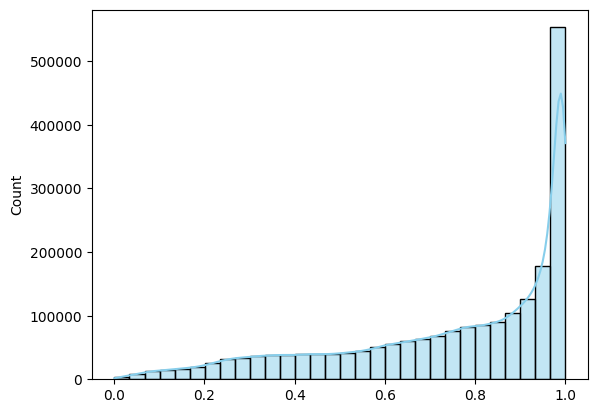

In [67]:
sns.histplot(test_preds, kde=True, bins=30, color='skyblue')

<Axes: ylabel='Count'>

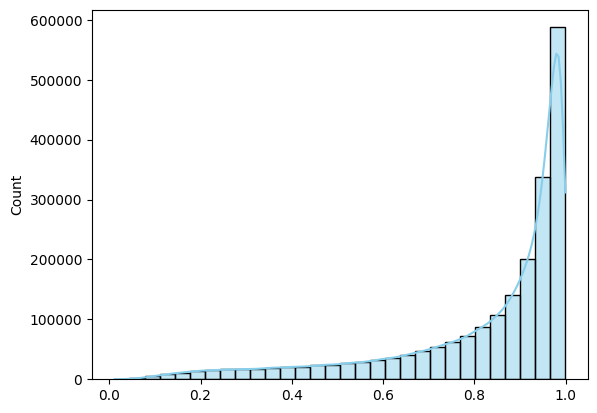

In [68]:
sns.histplot(pred_[:,1], kde=True, bins=30, color='skyblue')

In [69]:
pip install lightgbm

  Using cached lightgbm-4.5.0-py3-none-win_amd64.whl (1.4 MB)
Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


In [70]:
pip install catboost

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


In [15]:
## Comparing 3 models
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

In [16]:
lgbm_model = LGBMClassifier(random_state=42,device='gpu')
catboost_model = CatBoostClassifier(verbose=0, random_state=42,task_type="GPU",devices='0')
xgboost_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)

In [17]:
# Dictionary to store model performances
model_performance = {}

# LightGBM
print('Training LightGBM Model...')
lgbm_val_mcc, lgbm_test_preds = k_fold_model_trainer(lgbm_model, X, y, skf, test_data)
model_performance['LightGBM'] = {'val_mcc': lgbm_val_mcc, 'test_preds': lgbm_test_preds}

# CatBoost
print('\nTraining CatBoost Model...')
catboost_val_mcc, catboost_test_preds = k_fold_model_trainer(catboost_model, X, y, skf, test_data)
model_performance['CatBoost'] = {'val_mcc': catboost_val_mcc, 'test_preds': catboost_test_preds}

# XGBoost
print('\nTraining XGBoost Model...')
xgboost_val_mcc, xgboost_test_preds = k_fold_model_trainer(xgboost_model, X, y, skf, test_data)
model_performance['XGBoost'] = {'val_mcc': xgboost_val_mcc, 'test_preds': xgboost_test_preds}

Training LightGBM Model...
Fold 1
[LightGBM] [Info] Number of positive: 1364317, number of negative: 1129239
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 974
[LightGBM] [Info] Number of data points in the train set: 2493556, number of used features: 20
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2060 SUPER, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 13 dense feature groups (38.05 MB) transferred to GPU in 0.035616 secs. 1 sparse feature groups
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.547137 -> initscore=0.189110
[LightGBM] [Info] Start training from score 0.189110
Training MCC: 0.9761
Validation MCC: 0.9761

Fold 2
[LightGBM] [Info] Number of positive: 1364317, number of negative: 1129239
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 990
[LightGBM] [Info] Nu

c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\core.py:158: UserWarning: [00:30:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Training MCC: 0.9828
Validation MCC: 0.9824

Fold 2


c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\core.py:158: UserWarning: [00:31:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Training MCC: 0.9827
Validation MCC: 0.9822

Fold 3


c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\core.py:158: UserWarning: [00:31:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Training MCC: 0.9826
Validation MCC: 0.9823

Fold 4


c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\core.py:158: UserWarning: [00:31:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Training MCC: 0.9829
Validation MCC: 0.9820

Fold 5


c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\core.py:158: UserWarning: [00:31:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Training MCC: 0.9826
Validation MCC: 0.9824

Average Training MCC: 0.9827
Average Validation MCC: 0.9822


In [18]:
lgbm_val_mcc

0.9768499939357745

In [19]:
catboost_val_mcc

0.9798453510936591

In [20]:
xgboost_val_mcc

0.9822340649236725

In [ ]:
# K-FOLD SE test ki predicions ki probability ka mean ye lia

Now we know which model performed best

## Now we will hypertune three model and then train using cross-validation 

In [6]:
import optuna
from optuna.samplers import TPESampler

## Lightgbm hyperparam tuning

In [7]:
import pandas as pd
from lightgbm import LGBMClassifier

In [5]:
X = pd.read_csv('X.csv')
Y = pd.read_csv('Y.csv')

In [6]:
X.index.name = 'id'
Y = pd.read_csv('Y.csv')
Y.index.name = 'id'


In [7]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

In [13]:
pip install optuna-integration[lightgbm]

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


In [8]:
from optuna.integration import LightGBMPruningCallback
from sklearn.model_selection import StratifiedKFold
import numpy as np

In [29]:
Y

,class
id,
0,0.0
1,1.0
2,0.0
3,0.0
4,0.0
...,...
3116940,0.0
3116941,0.0
3116942,1.0


In [12]:
#
def objective(trial):
    # Define hyperparameters to tune
    params = {
        "device_type": trial.suggest_categorical("device_type", ['gpu']),
        "n_estimators": trial.suggest_categorical("n_estimators", [10000]),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
        "num_leaves": trial.suggest_int("num_leaves", 20, 3000, step=20),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 10000, step=100),
        "lambda_l1": trial.suggest_int("lambda_l1", 0, 100, step=5),
        "lambda_l2": trial.suggest_int("lambda_l2", 0, 100, step=5),
        "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        "bagging_fraction": trial.suggest_float(
            "bagging_fraction", 0.2, 0.95, step=0.1
        ),
        "bagging_freq": trial.suggest_categorical("bagging_freq", [1]),
        "feature_fraction": trial.suggest_float(
            "feature_fraction", 0.2, 0.95, step=0.1
        ),
    }
     lgbm_model = LGBMClassifier(**study.best_params,random_state=42)

    # Evaluate model on validation set
    return avg_val_mcc

In [13]:
study = optuna.create_study(direction='maximize', sampler=TPESampler(seed=42))
study.optimize(objective, n_trials=50)

study.best_params
lgbm_model = LGBMClassifier(**study.best_params,random_state=42)
import pickle
# Save model
with open('lgbm.pkl','wb') as f:
    pickle.dump(lgbm_model,f)

[I 2024-09-09 02:25:56,578] A new study created in memory with name: no-name-e0b5e33d-ffed-4eb1-8931-b8e5cad7b8bc
c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:689: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(


Fold 1
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_gain_to_split is set=0.8712541825229919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8712541825229919
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] lambda_l2 is set=15, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[Ligh

[W 2024-09-09 02:32:29,586] Trial 0 failed with parameters: {'device_type': 'gpu', 'n_estimators': 10000, 'learning_rate': 0.11861663446573512, 'num_leaves': 2860, 'max_depth': 10, 'min_data_in_leaf': 6100, 'lambda_l1': 15, 'lambda_l2': 15, 'min_gain_to_split': 0.8712541825229919, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001} because of the following error: NameError("name 'matthews_corrcoef' is not defined").
Traceback (most recent call last):
  File "c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\study\_optimize.py", line 197, in _run_trial
    value_or_values = func(trial)
  File "C:\Users\ADMIN\AppData\Local\Temp\ipykernel_12636\170763992.py", line 49, in objective
    val_mcc = matthews_corrcoef(y_val, y_val_pred)
NameError: name 'matthews_corrcoef' is not defined
[W 2024-09-09 02:32:29,591] Trial 0 failed with value None.


NameError: name 'matthews_corrcoef' is not defined

## First do the best hyper param tuning and then train the model using K-FOLD

In [1]:

from sklearn.model_selection import StratifiedKFold
import numpy as np
import optuna
from optuna.samplers import TPESampler
from lightgbm import LGBMClassifier

In [6]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [11]:
def objective(trial):    
    params = {
        "n_estimators": trial.suggest_categorical("n_estimators", [10000]),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
        "num_leaves": trial.suggest_int("num_leaves", 20, 3000, step=20),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 10000, step=100),
        "lambda_l1": trial.suggest_int("lambda_l1", 0, 100, step=5),
        "lambda_l2": trial.suggest_int("lambda_l2", 0, 100, step=5),
        "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        "bagging_fraction": trial.suggest_float(
            "bagging_fraction", 0.2, 0.95, step=0.1
        ),
        "bagging_freq": trial.suggest_categorical("bagging_freq", [1]),
        "feature_fraction": trial.suggest_float(
            "feature_fraction", 0.2, 0.95, step=0.1
        ),
    }
    lgbm_model = LGBMClassifier(**params,random_state=42)
    lgbm_model.fit(X_train,y_train)
    # Evaluate model on validation set
    val_score = lgbm_model.score(X_test, y_test)
    return val_score

In [10]:
study = optuna.create_study(direction='maximize', sampler=TPESampler(seed=42))
study.optimize(objective, n_trials=20)

[I 2024-09-09 12:57:07,358] A new study created in memory with name: no-name-2454d608-c54c-4eee-8966-6672da78c6bb
c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:689: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_gain_to_split is set=0.8712541825229919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8712541825229919
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] lambda_l2 is set=15, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [

[I 2024-09-09 13:04:43,889] Trial 0 finished with value: 0.9915189392177276 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11861663446573512, 'num_leaves': 2860, 'max_depth': 10, 'min_data_in_leaf': 6100, 'lambda_l1': 15, 'lambda_l2': 15, 'min_gain_to_split': 0.8712541825229919, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 0 with value: 0.9915189392177276.
c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:689: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_gain_to_split is set=2.7510676478015075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7510676478015075
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] lambda_l2 is set=15, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [

[I 2024-09-09 13:11:45,349] Trial 1 finished with value: 0.9907136635391385 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21534104756085318, 'num_leaves': 80, 'max_depth': 12, 'min_data_in_leaf': 8400, 'lambda_l1': 20, 'lambda_l2': 15, 'min_gain_to_split': 2.7510676478015075, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 0 with value: 0.9915189392177276.
c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:689: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_gain_to_split is set=6.841049763255539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.841049763255539
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [

[I 2024-09-09 13:19:34,357] Trial 2 finished with value: 0.9904890846646316 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13526405540621358, 'num_leaves': 880, 'max_depth': 9, 'min_data_in_leaf': 1500, 'lambda_l1': 30, 'lambda_l2': 35, 'min_gain_to_split': 6.841049763255539, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 0 with value: 0.9915189392177276.
c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:689: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_gain_to_split is set=14.233283058799998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.233283058799998
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] lambda_l2 is set=5, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] feature_fraction is set

[I 2024-09-09 13:23:58,082] Trial 3 finished with value: 0.98701132037941 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15912798713994736, 'num_leaves': 1780, 'max_depth': 3, 'min_data_in_leaf': 6200, 'lambda_l1': 15, 'lambda_l2': 5, 'min_gain_to_split': 14.233283058799998, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 0 with value: 0.9915189392177276.
c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:689: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=0.5158278167282759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5158278167282759
[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] feature_fraction is s

## CatBoost Hyperparam tuning

In [10]:

from sklearn.model_selection import StratifiedKFold
import numpy as np
import optuna
from optuna.samplers import TPESampler
from catboost import CatBoostClassifier

In [11]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [12]:
def objective(trial):
    train_x, valid_x, train_y, valid_y = train_test_split(X,y, test_size=0.3)

    param = {
        'iterations': 400,
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.1, 1.0),
        'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1, 100),
        'bagging_temperature': trial.suggest_loguniform('bagging_temperature', 0.1, 20.0),
        'random_strength': trial.suggest_float('random_strength', 1.0, 2.0),
        'depth': trial.suggest_int('depth', 1, 10),
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 1, 300),
        "task_type": "GPU",
        
    }
    catboost_model = CatBoostClassifier(**param, verbose=0, random_state=42,devices='0')
    catboost_model.fit(train_x,train_y)
    val_score = catboost_model.score(X_test, y_test)
    
    return val_score


In [13]:
study = optuna.create_study(direction='maximize', sampler=TPESampler(seed=42))
study.optimize(objective, n_trials=10)

[I 2024-09-10 21:57:40,700] A new study created in memory with name: no-name-e96ff777-ed10-4395-ae48-d930845e5c31
C:\Users\ADMIN\AppData\Local\Temp\ipykernel_12656\1970465219.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.1, 1.0),
C:\Users\ADMIN\AppData\Local\Temp\ipykernel_12656\1970465219.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1, 100),
C:\Users\ADMIN\AppData\Local\Temp\ipykernel_12656\1970465219.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/op

In [9]:
study.best_params

{'learning_rate': 0.4050837781329674,
 'l2_leaf_reg': 2.1930485556643684,
 'bagging_temperature': 0.14115155493448336,
 'random_strength': 1.9488855372533331,
 'depth': 10,
 'min_data_in_leaf': 243}

### K-Fold on best predictions

In [1]:
from sklearn.base import clone
from sklearn.metrics import matthews_corrcoef

In [8]:
test_data =pd.read_csv('test_proc.csv')

In [14]:
model = CatBoostClassifier(**study.best_params, verbose=0, random_state=42,task_type = "GPU",devices='0')

In [18]:
n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

def k_fold_model_trainer(model, X, y, skf, test_data):
    """
    Trains the model using Stratified K-Fold cross-validation and evaluates using MCC.
    Returns the average validation MCC and test predictions.
    """
    train_mcc_scores = []
    val_mcc_scores = []
    test_preds = np.zeros(len(test_data))
    val_preds_cat = []
    fold_number = 1
    for train_index, val_index in skf.split(X, y):
        print(f'Fold {fold_number}')
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y[train_index], y[val_index]
        
        # Clone the model to ensure fresh parameters
        model_clone = clone(model)
        
        # Fit the model
        model_clone.fit(X_train, y_train)
        
        # Predict on training and validation sets
        y_train_pred = model_clone.predict(X_train)
        y_val_pred = model_clone.predict(X_val)
        
        # Calculate MCC scores
        train_mcc = matthews_corrcoef(y_train, y_train_pred)
        val_mcc = matthews_corrcoef(y_val, y_val_pred)
        
        print(f'Training MCC: {train_mcc:.4f}')
        print(f'Validation MCC: {val_mcc:.4f}\n')
        
        train_mcc_scores.append(train_mcc)
        val_mcc_scores.append(val_mcc)
        # Predict on val data
        val_preds_cat += model_clone.predict_proba(X_val)
        # Predict on test data
        test_preds += model_clone.predict_proba(test_data)[:, 1]
        
        fold_number += 1
    
    # Average test predictions
    test_preds /= n_splits
    
    # Average MCC scores
    avg_train_mcc = np.mean(train_mcc_scores)
    avg_val_mcc = np.mean(val_mcc_scores)
    
    print(f'Average Training MCC: {avg_train_mcc:.4f}')
    print(f'Average Validation MCC: {avg_val_mcc:.4f}')
    
    return avg_val_mcc, test_preds,val_preds_cat

In [19]:
avg_val_mcc, test_preds, val_preds_cat = k_fold_model_trainer(model,X,y,skf,test_data)

Fold 1
Training MCC: 0.9892
Validation MCC: 0.9832

Fold 2
Training MCC: 0.9891
Validation MCC: 0.9833

Fold 3
Training MCC: 0.9892
Validation MCC: 0.9834

Fold 4
Training MCC: 0.9892
Validation MCC: 0.9831

Fold 5
Training MCC: 0.9891
Validation MCC: 0.9835

Average Training MCC: 0.9892
Average Validation MCC: 0.9833


In [26]:
pd.DataFrame({'cat')

In [28]:
val_preds_cat[:,1]

array([0.00198086, 0.99837444, 0.07073228, ..., 0.9987155 , 0.99815132,
       0.99948941])

In [ ]:
np.read

In [24]:
test_pred_cat = test_preds

## XGBoost hyper param tuning then k fold cross valid training

In [2]:
from xgboost import XGBClassifier
from sklearn.metrics import matthews_corrcoef
import pandas as pd
from sklearn.model_selection import StratifiedKFold
import numpy as np
import optuna
from optuna.samplers import TPESampler
from catboost import CatBoostClassifier
import pandas as pd
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder


In [3]:
X = pd.read_csv('X.csv')
y = pd.read_csv('Y.csv')
y.set_index('id',inplace=True)
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
print(y)
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[0 1 0 ... 1 0 1]


In [4]:
xgboost_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42,n_estimators=1000, 
                        max_depth=5,tree_method= 'gpu_hist')

In [5]:
def objective(trial):
    # Define hyperparameters to tune
    params = {
        'max_depth': trial.suggest_int('max_depth', 2, 10),
        'learning_rate': trial.suggest_float('learning_rate', 1e-3, 1.0, log=True),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'tree_method': 'gpu_hist',
        'use_label_encoder':'False',
        'random_state':'42'
    }
    xgboost_model = XGBClassifier(**params, eval_metric='logloss',n_estimators=1000)
    # Train XGBoost model with the selected hyperparameters
    
    xgboost_model.fit(X_train, y_train)

    # Evaluate model on validation set
    val_score = xgboost_model.score(X_test, y_test)
    return val_score

In [13]:
study = optuna.create_study(direction='maximize', sampler=TPESampler(seed=42))
study.optimize(objective, n_trials=50)

[I 2024-09-11 20:14:52,616] A new study created in memory with name: no-name-83f30059-c05a-4106-93d4-a4b2c303ed6c
c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\core.py:158: UserWarning: [20:14:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\common\error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\core.py:158: UserWarning: [20:14:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-

In [1]:
study.best_params

NameError: name 'study' is not defined

In [3]:
model = XGBClassifier(use_label_encoder=False,max_depth= 7,
 learning_rate = 0.13311216080736885,
 subsample = 0.5102922471479012,
 colsample_bytree = 0.9849549260809971,tree_method= 'gpu_hist')

In [34]:
model = XGBClassifier(use_label_encoder=False,**study.best_params,tree_method= 'gpu_hist')

In [2]:
n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

def k_fold_model_trainer(model, X, y, skf, test_data):
    """
    Trains the model using Stratified K-Fold cross-validation and evaluates using MCC.
    Returns the average validation MCC and test predictions.
    """
    train_mcc_scores = []
    val_mcc_scores = []
    test_preds = np.zeros(len(test_data))
    oof_xgb = []
    fold_number = 1
    for train_index, val_index in skf.split(X, y):
        print(f'Fold {fold_number}')
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y[train_index], y[val_index]
        
        # Clone the model to ensure fresh parameters
        model_clone = clone(model)
        
        # Fit the model
        model_clone.fit(X_train, y_train)
        
        # Predict on training and validation sets
        y_train_pred = model_clone.predict(X_train)
        y_val_pred = model_clone.predict(X_val)
        
        # Calculate MCC scores
        train_mcc = matthews_corrcoef(y_train, y_train_pred)
        val_mcc = matthews_corrcoef(y_val, y_val_pred)
        
        print(f'Training MCC: {train_mcc:.4f}')
        print(f'Validation MCC: {val_mcc:.4f}\n')
        
        train_mcc_scores.append(train_mcc)
        val_mcc_scores.append(val_mcc)
        oof_xgb += model_clone.predict_proba(X_val)[:,1]
        # Predict on test data
        test_preds += model_clone.predict_proba(test_data)[:, 1]
        
        fold_number += 1
    
    # Average test predictions
    test_preds /= n_splits
    
    # Average MCC scores
    avg_train_mcc = np.mean(train_mcc_scores)
    avg_val_mcc = np.mean(val_mcc_scores)
    
    print(f'Average Training MCC: {avg_train_mcc:.4f}')
    print(f'Average Validation MCC: {avg_val_mcc:.4f}')
    
    return avg_val_mcc, test_preds,oof_xgb

NameError: name 'StratifiedKFold' is not defined

In [1]:
avg_val_mcc,test_preds,oof_xgb = k_fold_model_trainer(model, X, y, skf, test_data)

NameError: name 'k_fold_model_trainer' is not defined

In [38]:
test_preds_xgb = test_preds

In [42]:
test_pred_cat

array([0.39526727, 0.74622421, 0.73138472, ..., 0.68960055, 0.39078668,
       0.85602141])

In [46]:
results =pd.DataFrame({'cat_pred':test_pred_cat,'xgb_pred':test_preds_xgb})

In [48]:
results.to_csv('2_ensemble.csv',index=False)

In [3]:
import pandas as pd
results = pd.read_csv('2_ensemble.csv')

### Ensembling 2 models cat and xgb

In [56]:
results

,cat_pred,xgb_pred
0,0.395267,0.671634
1,0.746224,0.915174
2,0.731385,0.977569
3,0.951480,0.780010
4,0.347484,0.618708
...,...,...
2077959,0.999071,0.990057
2077960,0.997944,0.987748
2077961,0.689601,0.703046
2077962,0.390787,0.744861


In [55]:
results.mean(axis=1)

0          0.533451
1          0.830699
2          0.854477
3          0.865745
4          0.483096
             ...   
2077959    0.994564
2077960    0.992846
2077961    0.696323
2077962    0.567824
2077963    0.744338
Length: 2077964, dtype: float64

<Axes: ylabel='Count'>

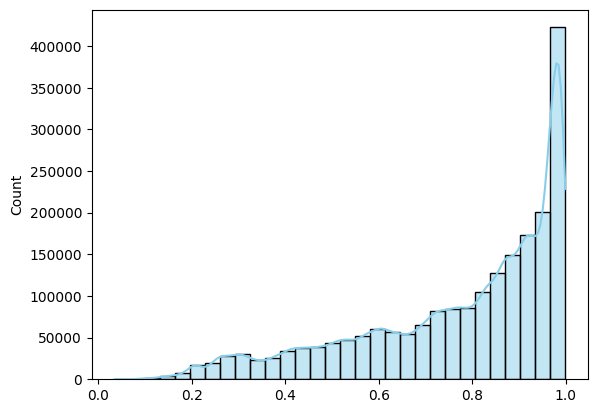

In [58]:
import seaborn as sns
sns.histplot(test_preds_xgb, kde=True, bins=30, color='skyblue')

<Axes: ylabel='Count'>

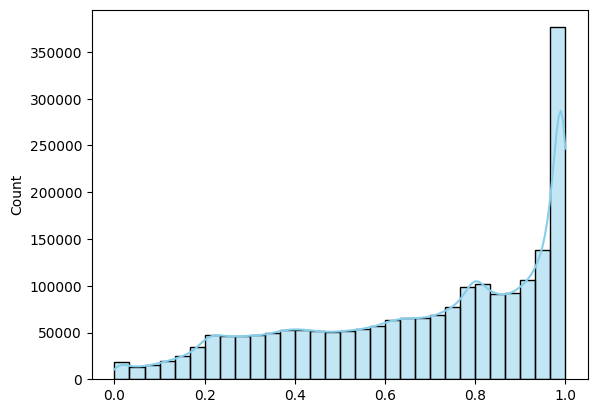

In [59]:
sns.histplot(test_pred_cat, kde=True, bins=30, color='skyblue')

<Axes: ylabel='Count'>

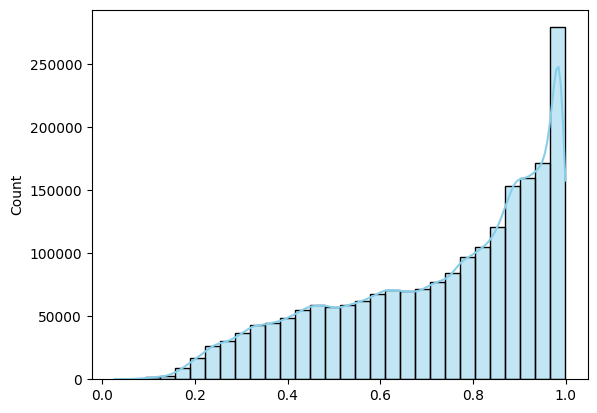

In [60]:
## Soft Voting
sns.histplot(results.mean(axis=1), kde=True, bins=30, color='skyblue')

In [5]:
## Hard Voting
hard_voting = results.mode(axis=1)

KeyboardInterrupt: 

In [6]:
hard_voting

NameError: name 'hard_voting' is not defined

## Hill climb ensembling